### Main Model

### Extracting ELA Images

In [20]:
import os
from PIL import Image, ImageChops, ImageEnhance

# Define input and output folders
input_folder = "C:/Users/vinay/Downloads/CASIA2.0_revised_corrected/casia/Tp"
output_folder = "C:/Users/vinay/Downloads/CASIA2.0_revised_corrected/casia/ela_output"

# Ensure the output folder exists
os.makedirs(output_folder, exist_ok=True)

# Function to create ELA image
def create_ela_image(input_path, output_path, quality=95):
    # Open the original image
    original_image = Image.open(input_path)
    
    # Save the image at a specified quality
    temp_path = "temp.jpg"
    original_image.save(temp_path, "JPEG", quality=quality)
    
    # Open the re-saved image and calculate the difference
    resaved_image = Image.open(temp_path)
    ela_image = ImageChops.difference(original_image, resaved_image)
    
    # Enhance the difference for better visibility
    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    scale = 255.0 / max_diff if max_diff != 0 else 1
    ela_image = ImageEnhance.Brightness(ela_image).enhance(scale)
    
    # Save the ELA image
    ela_image.save(output_path)

# Process each image in the input folder
for file_name in os.listdir(input_folder):
    input_path = os.path.join(input_folder, file_name)
    output_path = os.path.join(output_folder, file_name)
    
    # Check if the file is an image
    if file_name.lower().endswith((".jpg", ".jpeg", ".png")):
        create_ela_image(input_path, output_path)

print("ELA images created and saved in:", output_folder)


ELA images created and saved in: C:/Users/vinay/Downloads/CASIA2.0_revised_corrected/casia/ela_output


In [22]:
import os
from PIL import Image, ImageChops, ImageEnhance

input_folder = "C:/Users/vinay/Downloads/CASIA2.0_revised_corrected/casia/Tp"
output_folder = "C:/Users/vinay/Downloads/CASIA2.0_revised_corrected/casia/ELA_Tp"

# Ensure the output folder exists
os.makedirs(output_folder, exist_ok=True)

# Function to create ELA image
def convert_to_ela_image(input_path, output_path, quality=98):
    temp_filename = 'temp_file_name.jpg'
    
    # Open the original image
    image = Image.open(input_path).convert('RGB')
    
    # Save and reload the image with compression
    image.save(temp_filename, 'JPEG', quality=quality)
    temp_image = Image.open(temp_filename)
    
    # Calculate ELA image
    ela_image = ImageChops.difference(image, temp_image)
    
    # Enhance the brightness for better visibility
    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    scale = 255.0 / max_diff if max_diff != 0 else 1
    ela_image = ImageEnhance.Brightness(ela_image).enhance(scale)
    
    # Save the ELA image to the output path
    ela_image.save(output_path)

# Process each image in the input folder
for root, _, files in os.walk(input_folder):
    for file in files:
        if file.lower().endswith(('jpg', 'bmp', 'tif', 'tiff', 'png')):
            # Get full input and output paths
            input_path = os.path.join(root, file)
            
            # Recreate the folder structure in the output directory
            relative_path = os.path.relpath(root, input_folder)
            output_dir = os.path.join(output_folder, relative_path)
            os.makedirs(output_dir, exist_ok=True)
            
            output_path = os.path.join(output_dir, file)
            
            # Convert and save the ELA image
            convert_to_ela_image(input_path, output_path)

print(f"ELA images saved in: {output_folder}")


ELA images saved in: C:/Users/vinay/Downloads/CASIA2.0_revised_corrected/casia/ELA_Tp


### Preparing the data for Training

In [1]:
import os
import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split

# Resize dimensions for model input
image_size = (128, 128)

# Function to load and preprocess an image
def load_image(image_path, size):
    return np.array(Image.open(image_path).convert('RGB').resize(size)) / 255.0

# Load dataset
x1_data = []  # Original images
x2_data = []  # ELA images
y_data = []   # Masks

# Paths
tp_folder = "C:/Users/vinay/Downloads/CASIA2.0_revised_corrected/casia/Tp"
ela_tp_folder = "C:/Users/vinay/Downloads/CASIA2.0_revised_corrected/casia/ELA_Tp"
gt_folder = "C:/Users/vinay/Downloads/CASIA2.0_revised_corrected/casia/Gt"
sample_limit = 1500  # Limit to first 1500 valid samples

for file_name in os.listdir(tp_folder):
    if len(x1_data) >= sample_limit:
        break
    if file_name.lower().endswith(('jpg', 'bmp', 'tif', 'tiff', 'png')):
        # Modify the filename to match the mask's filename convention
        base_name = file_name.rsplit('.', 1)[0]
        gt_name = base_name + "_gt.png"  # Appending '_gt' for ground truth and changing extension to '.png'

        # Paths for x1, x2, and y
        tp_path = os.path.join(tp_folder, file_name)
        ela_tp_path = os.path.join(ela_tp_folder, file_name)
        gt_path = os.path.join(gt_folder, gt_name)  # Using modified gt_name

        # Load images
        x1_data.append(load_image(tp_path, image_size))  # Original image
        x2_data.append(load_image(ela_tp_path, image_size))  # ELA image

        # Load and preprocess the mask
        if os.path.exists(gt_path):
            mask = load_image(gt_path, image_size)
            y_data.append(mask)  # Add the mask to labels
            print("mask")
        else:
            # Handle cases where no corresponding mask is found
            y_data.append(np.zeros((128, 128, 3)))  # Assuming the mask is an RGB image

# Convert to NumPy arrays
x1_data = np.array(x1_data)
x2_data = np.array(x2_data)
y_data = np.array(y_data)  # No need for one-hot encoding

# Split data into training and testing sets
x1_train, x1_test, x2_train, x2_test, y_train, y_test = train_test_split(
    x1_data, x2_data, y_data, test_size=0.2, random_state=42
)

print(f"Training data size: {len(x1_train)}")
print(f"Testing data size: {len(x1_test)}")


mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask
mask


In [26]:
x1_train

array([[[[0.01960784, 0.05098039, 0.35294118],
         [0.04705882, 0.11372549, 0.39607843],
         [0.04313725, 0.14117647, 0.4       ],
         ...,
         [0.01568627, 0.00784314, 0.29803922],
         [0.01176471, 0.00392157, 0.28627451],
         [0.01568627, 0.01176471, 0.28235294]],

        [[0.01176471, 0.05490196, 0.36078431],
         [0.01568627, 0.08235294, 0.36862745],
         [0.04313725, 0.13333333, 0.4       ],
         ...,
         [0.01176471, 0.00392157, 0.30588235],
         [0.00784314, 0.        , 0.29019608],
         [0.01176471, 0.00784314, 0.29019608]],

        [[0.02352941, 0.09411765, 0.39607843],
         [0.        , 0.0627451 , 0.35686275],
         [0.01568627, 0.09019608, 0.36862745],
         ...,
         [0.01176471, 0.00392157, 0.31764706],
         [0.00784314, 0.        , 0.30588235],
         [0.01176471, 0.        , 0.30196078]],

        ...,

        [[0.58039216, 0.47843137, 0.20784314],
         [0.61568627, 0.50196078, 0.23921569]

### Model Architecture and Summary 

In [27]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Dense, Flatten, Reshape

# Define input shape
input_shape = (image_size[0], image_size[1], 3)

# First input (x1)
input_x1 = Input(shape=input_shape, name='Input_X1')
x1 = Conv2D(64, (3, 3), activation='relu', padding='same')(input_x1)
x1 = MaxPooling2D((2, 2))(x1)
x1 = Conv2D(128, (3, 3), activation='relu', padding='same')(x1)
x1 = MaxPooling2D((2, 2))(x1)
x1 = Flatten()(x1)

# Second input (x2)
input_x2 = Input(shape=input_shape, name='Input_X2')
x2 = Conv2D(64, (3, 3), activation='relu', padding='same')(input_x2)
x2 = MaxPooling2D((2, 2))(x2)
x2 = Conv2D(128, (3, 3), activation='relu', padding='same')(x2)
x2 = MaxPooling2D((2, 2))(x2)
x2 = Flatten()(x2)

# Combine features
combined = concatenate([x1, x2])
combined = Dense(256, activation='relu')(combined)
combined = Dense(512, activation='relu')(combined)

# Reshape for reconstruction
reconstruct_shape = (input_shape[0] // 4, input_shape[1] // 4, 128)
combined = Dense(reconstruct_shape[0] * reconstruct_shape[1] * reconstruct_shape[2], activation='relu')(combined)
combined = Reshape(reconstruct_shape)(combined)

# Reconstruction using transpose convolutions
x = Conv2D(128, (3, 3), activation='relu', padding='same')(combined)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
output = Conv2D(3, (3, 3), activation='sigmoid', padding='same', name='Output')(x)

# Define the model
model = Model(inputs=[input_x1, input_x2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])

model.summary()


Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ Input_X1            │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Input_X2            │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_60 (Conv2D)  │ (None, 128, 128,  │      1,792 │ Input_X1[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_62 (Conv2D)  │ (None, 128, 128,  │      1,792 │ Input_X2[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_40    │ (None, 64, 64,    │          0 │ conv2d_60[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_42    │ (None, 64, 64,    │          0 │ conv2d_62[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_61 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d_40… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_63 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d_42… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_41    │ (None, 32, 32,    │          0 │ conv2d_61[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_43    │ (None, 32, 32,    │          0 │ conv2d_63[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_20          │ (None, 131072)    │          0 │ max_pooling2d_41… │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_21          │ (None, 131072)    │          0 │ max_pooling2d_43… │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_10      │ (None, 262144)    │          0 │ flatten_20[0][0], │
│ (Concatenate)       │                   │            │ flatten_21[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_30 (Dense)    │ (None, 256)       │ 67,109,120 │ concatenate_10[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_31 (Dense)    │ (None, 512)       │    131,584 │ dense_30[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_32 (Dense)    │ (None, 131072)    │ 67,239,936 │ dense_31[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_10          │ (None, 32, 32,    │          0 │ dense_32[0][0]    │
│ (Reshape)           │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_64 (Conv2D)  │ (None, 32, 32,    │    147,584 │ reshape_10[0][0]

 Total params: 134,855,043 (514.43 MB)

 Trainable params: 134,855,043 (514.43 MB)

 Non-trainable params: 0 (0.00 B)

### Train Test Split

In [28]:
x1_train_split, x1_val_split, x2_train_split, x2_val_split, y_train_split, y_val_split = train_test_split(
    x1_train, x2_train, y_train, test_size=0.2, random_state=42
)

### Model Training

In [29]:
input_shape = (image_size[0], image_size[1], 3)

# First input
input_x1 = Input(shape=input_shape, name='Input_X1')
x1 = Conv2D(64, (3, 3), activation='relu', padding='same')(input_x1)
x1 = MaxPooling2D((2, 2))(x1)
x1 = Conv2D(128, (3, 3), activation='relu', padding='same')(x1)
x1 = MaxPooling2D((2, 2))(x1)
x1 = Flatten()(x1)

# Second input
input_x2 = Input(shape=input_shape, name='Input_X2')
x2 = Conv2D(64, (3, 3), activation='relu', padding='same')(input_x2)
x2 = MaxPooling2D((2, 2))(x2)
x2 = Conv2D(128, (3, 3), activation='relu', padding='same')(x2)
x2 = MaxPooling2D((2, 2))(x2)
x2 = Flatten()(x2)

# Combine features
combined = concatenate([x1, x2])
combined = Dense(256, activation='relu')(combined)
combined = Dense(512, activation='relu')(combined)

# Reshape for reconstruction
reconstruct_shape = (image_size[0] // 4, image_size[1] // 4, 128)
combined = Dense(reconstruct_shape[0] * reconstruct_shape[1] * reconstruct_shape[2], activation='relu')(combined)
combined = Reshape(reconstruct_shape)(combined)

# Reconstruction
x = Conv2D(128, (3, 3), activation='relu', padding='same')(combined)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
output = Conv2D(3, (3, 3), activation='sigmoid', padding='same', name='Output')(x)

# Define the model
model = Model(inputs=[input_x1, input_x2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])

# Model summary
model.summary()

# Train the model
history = model.fit(
    [x1_train, x2_train], y_train,
    validation_split=0.2,
    epochs=20,
    batch_size=16
)

# Save the model
model.save("image_reconstruction_model.h5")

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ Input_X1            │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Input_X2            │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_66 (Conv2D)  │ (None, 128, 128,  │      1,792 │ Input_X1[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_68 (Conv2D)  │ (None, 128, 128,  │      1,792 │ Input_X2[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_44    │ (None, 64, 64,    │          0 │ conv2d_66[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_46    │ (None, 64, 64,    │          0 │ conv2d_68[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_67 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d_44… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_69 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d_46… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_45    │ (None, 32, 32,    │          0 │ conv2d_67[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_47    │ (None, 32, 32,    │          0 │ conv2d_69[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_22          │ (None, 131072)    │          0 │ max_pooling2d_45… │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_23          │ (None, 131072)    │          0 │ max_pooling2d_47… │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_11      │ (None, 262144)    │          0 │ flatten_22[0][0], │
│ (Concatenate)       │                   │            │ flatten_23[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_33 (Dense)    │ (None, 256)       │ 67,109,120 │ concatenate_11[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_34 (Dense)    │ (None, 512)       │    131,584 │ dense_33[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_35 (Dense)    │ (None, 131072)    │ 67,239,936 │ dense_34[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_11          │ (None, 32, 32,    │          0 │ dense_35[0][0]    │
│ (Reshape)           │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_70 (Conv2D)  │ (None, 32, 32,    │    147,584 │ reshape_11[0][0]

 Total params: 134,855,043 (514.43 MB)

 Trainable params: 134,855,043 (514.43 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 61s 967ms/step - accuracy: 0.3955 - loss: 0.1609 - val_accuracy: 0.1224 - val_loss: 0.1280
Epoch 2/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 57s 953ms/step - accuracy: 0.3326 - loss: 0.1279 - val_accuracy: 0.2811 - val_loss: 0.1203
Epoch 3/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 57s 948ms/step - accuracy: 0.2840 - loss: 0.1264 - val_accuracy: 0.3547 - val_loss: 0.1192
Epoch 4/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 57s 948ms/step - accuracy: 0.3472 - loss: 0.1202 - val_accuracy: 0.2425 - val_loss: 0.1102
Epoch 5/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 57s 952ms/step - accuracy: 0.3178 - loss: 0.1110 - val_accuracy: 0.3756 - val_loss: 0.1028
Epoch 6/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 57s 954ms/step - accuracy: 0.3357 - loss: 0.1020 - val_accuracy: 0.3040 - val_loss: 0.1029
Epoch 7/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 57s 954ms/step - accuracy: 0.3268 - loss: 0.0886 - val_accuracy: 0.3921 - val_loss: 0.1011
Epoch 8/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 57s 953ms/step - accuracy: 0.3351 - loss: 0.0764 - val_accu

In [30]:
x1_train.shape

(1200, 128, 128, 3)

### Model Predictions on Test Dataset

10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 212ms/step
(300, 128, 128, 3)


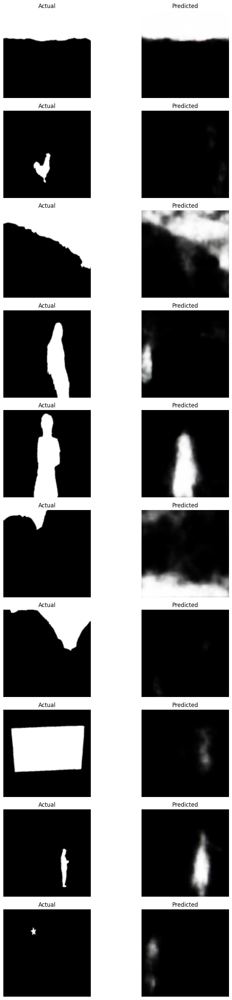

In [31]:
import matplotlib.pyplot as plt

# Predicting outputs on the training set
predictions = model.predict([x1_test, x2_test])

print(predictions.shape)

# Function to display images
def plot_images(actual, predicted, number_of_images=10):
    fig, axes = plt.subplots(number_of_images, 2, figsize=(10, 3 * number_of_images))
    for i in range(number_of_images):
        # Display actual image
        ax = axes[i, 0]
        ax.imshow(actual[i])
        ax.set_title('Actual')
        ax.axis('off')
        
        # Display predicted image
        ax = axes[i, 1]
        ax.imshow(predicted[i])
        ax.set_title('Predicted')
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# Plotting the images
plot_images(y_test[:10], predictions[:10])


# Model Predictions on Train Dataset

38/38 ━━━━━━━━━━━━━━━━━━━━ 8s 211ms/step


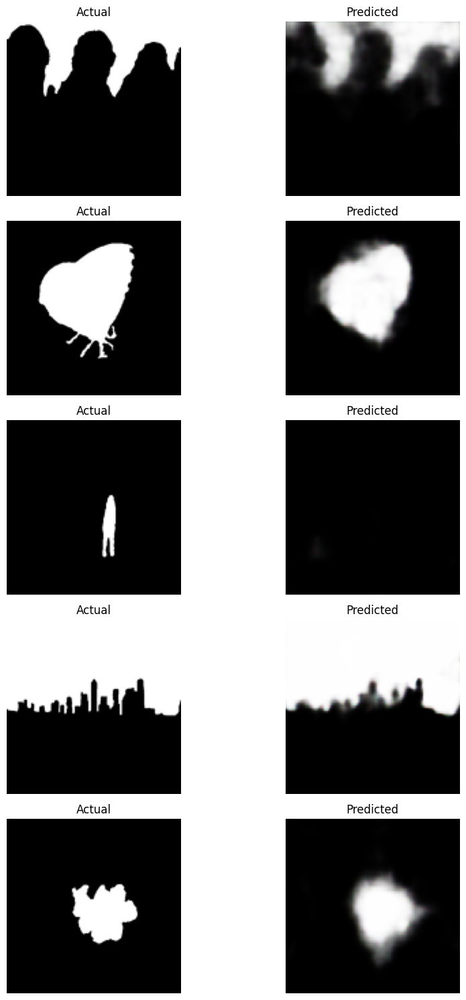

In [34]:
import matplotlib.pyplot as plt

# Predicting outputs on the training set
predictions = model.predict([x1_train, x2_train])

# Function to display images
def plot_images(actual, predicted, number_of_images=5):
    fig, axes = plt.subplots(number_of_images, 2, figsize=(10, 3 * number_of_images))
    for i in range(number_of_images):
        # Display actual image
        ax = axes[i, 0]
        ax.imshow(actual[i])
        ax.set_title('Actual')
        ax.axis('off')
        
        # Display predicted image
        ax = axes[i, 1]
        ax.imshow(predicted[i])
        ax.set_title('Predicted')
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# Plotting the images
plot_images(y_train[:10], predictions[:10])

### Metrics and Confusion Matrix for Test_data

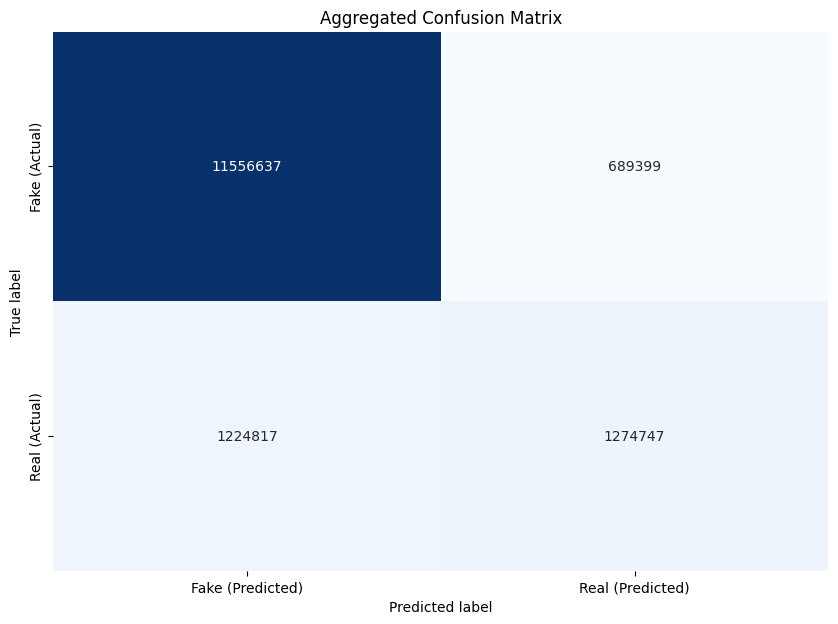

True Positives (TP): 1274747
True Negatives (TN): 11556637
False Positives (FP): 689399
False Negatives (FN): 1224817
Precision: 0.6490
Recall: 0.5100
F1-Score: 0.5712


In [33]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Assuming predictions and y_test are provided as lists of arrays corresponding to each image
# threshold = 0.5
sum_conf_matrix = np.zeros((2, 2), dtype=int)

for pred, actual in zip(predictions, y_test):
    predictions_binary = (pred > 0.5).astype(int)
    actual_binary = (actual > 0.5).astype(int)
    conf_matrix = confusion_matrix(actual_binary.flatten(), predictions_binary.flatten())
    sum_conf_matrix += conf_matrix

plt.figure(figsize=(10, 7))
sns.heatmap(sum_conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, 
            xticklabels=['Fake (Predicted)', 'Real (Predicted)'],
            yticklabels=['Fake (Actual)', 'Real (Actual)'])
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Aggregated Confusion Matrix')
plt.show()

tn, fp, fn, tp = sum_conf_matrix.ravel()

# Calculate Precision, Recall, and F1-Score
precision = tp / (tp + fp) if (tp + fp) > 0 else 0
recall = tp / (tp + fn) if (tp + fn) > 0 else 0
f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

print(f"True Positives (TP): {tp}")
print(f"True Negatives (TN): {tn}")
print(f"False Positives (FP): {fp}")
print(f"False Negatives (FN): {fn}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1_score:.4f}")


### Metrics and Confusion Matrix for Train Data

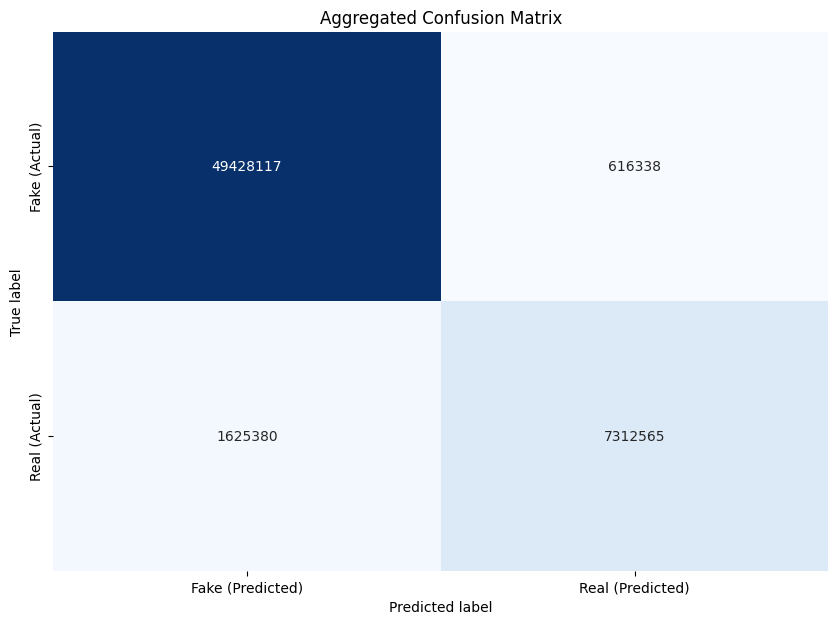

True Positives (TP): 7312565
True Negatives (TN): 49428117
False Positives (FP): 616338
False Negatives (FN): 1625380
Precision: 0.9223
Recall: 0.8181
F1-Score: 0.8671


In [35]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Assuming predictions and y_test are provided as lists of arrays corresponding to each image
# threshold = 0.5
sum_conf_matrix = np.zeros((2, 2), dtype=int)

for pred, actual in zip(predictions, y_train):
    predictions_binary = (pred > 0.5).astype(int)
    actual_binary = (actual > 0.5).astype(int)
    conf_matrix = confusion_matrix(actual_binary.flatten(), predictions_binary.flatten())
    sum_conf_matrix += conf_matrix

plt.figure(figsize=(10, 7))
sns.heatmap(sum_conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, 
            xticklabels=['Fake (Predicted)', 'Real (Predicted)'],
            yticklabels=['Fake (Actual)', 'Real (Actual)'])
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Aggregated Confusion Matrix')
plt.show()

tn, fp, fn, tp = sum_conf_matrix.ravel()

# Calculate Precision, Recall, and F1-Score
precision = tp / (tp + fp) if (tp + fp) > 0 else 0
recall = tp / (tp + fn) if (tp + fn) > 0 else 0
f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

print(f"True Positives (TP): {tp}")
print(f"True Negatives (TN): {tn}")
print(f"False Positives (FP): {fp}")
print(f"False Negatives (FN): {fn}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1_score:.4f}")


### Loading the Model

In [2]:
from tensorflow.keras.models import load_model
import tensorflow.keras.losses

# Map 'mse' to the actual Keras loss function
custom_objects = {"mse": tensorflow.keras.losses.MeanSquaredError()}

# Load the model with custom objects
model = load_model("image_reconstruction_model.h5", custom_objects=custom_objects)

# Verify the loaded model
model.summary()


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ Input_X1            │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Input_X2            │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_72 (Conv2D)  │ (None, 128, 128,  │      1,792 │ Input_X1[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_74 (Conv2D)  │ (None, 128, 128,  │      1,792 │ Input_X2[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_26    │ (None, 64, 64,    │          0 │ conv2d_72[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_28    │ (None, 64, 64,    │          0 │ conv2d_74[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_73 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d_26… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_75 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d_28… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_27    │ (None, 32, 32,    │          0 │ conv2d_73[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_29    │ (None, 32, 32,    │          0 │ conv2d_75[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_4 (Flatten) │ (None, 131072)    │          0 │ max_pooling2d_27… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_5 (Flatten) │ (None, 131072)    │          0 │ max_pooling2d_29… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_14      │ (None, 262144)    │          0 │ flatten_4[0][0],  │
│ (Concatenate)       │                   │            │ flatten_5[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 256)       │ 67,109,120 │ concatenate_14[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_7 (Dense)     │ (None, 512)       │    131,584 │ dense_6[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_8 (Dense)     │ (None, 131072)    │ 67,239,936 │ dense_7[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_2 (Reshape) │ (None, 32, 32,    │          0 │ dense_8[0][0]     │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_76 (Conv2D)  │ (None, 32, 32,    │    147,584 │ reshape_2[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 134,855,045 (514.43 MB)

 Trainable params: 134,855,043 (514.43 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

### Plotting Pixel Distribution for predicted images of test dataset

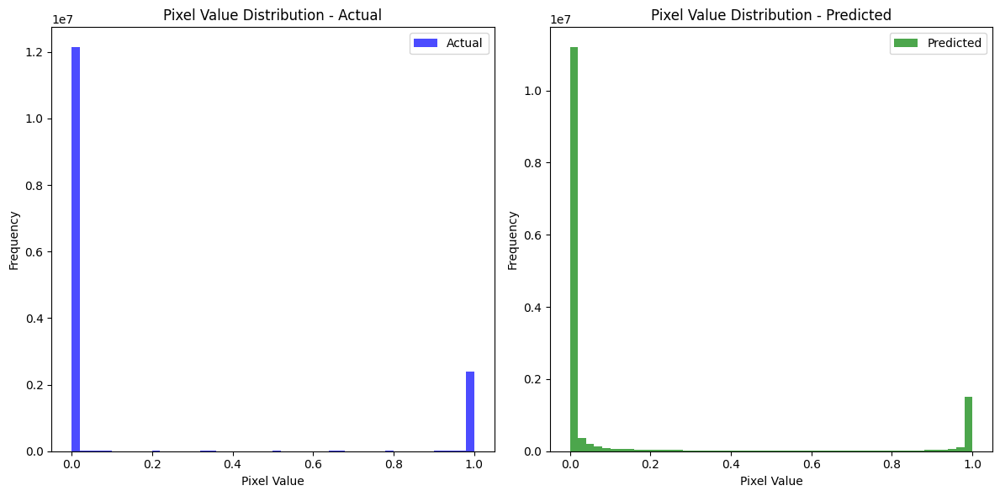

In [28]:
import numpy as np

# Function to plot pixel value distributions
def plot_pixel_distributions(actual, predicted, bins=50):
    plt.figure(figsize=(12, 6))

    # Plot distribution for actual images
    plt.subplot(1, 2, 1)
    plt.hist(actual.ravel(), bins=bins, color='blue', alpha=0.7, label='Actual')
    plt.title('Pixel Value Distribution - Actual')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.legend()

    # Plot distribution for predicted images
    plt.subplot(1, 2, 2)
    plt.hist(predicted.ravel(), bins=bins, color='green', alpha=0.7, label='Predicted')
    plt.title('Pixel Value Distribution - Predicted')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Assuming y_train and predictions are numpy arrays
plot_pixel_distributions(y_test, predictions)


10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 180ms/step
(300, 128, 128, 3)


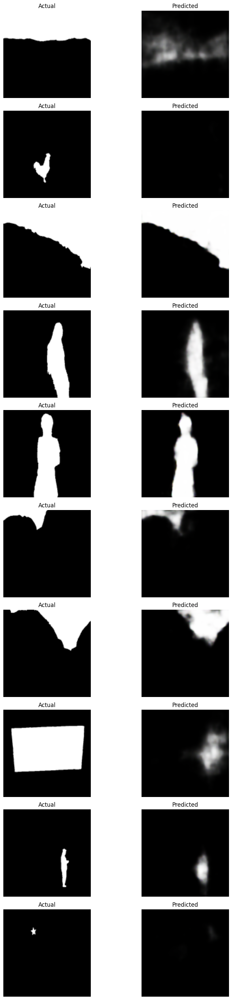

In [27]:
import matplotlib.pyplot as plt

# Predicting outputs on the training set
predictions = model.predict([x1_test, x2_test])

print(predictions.shape)

# Function to display images
def plot_images(actual, predicted, number_of_images=10):
    fig, axes = plt.subplots(number_of_images, 2, figsize=(10, 3 * number_of_images))
    for i in range(number_of_images):
        # Display actual image
        ax = axes[i, 0]
        ax.imshow(actual[i])
        ax.set_title('Actual')
        ax.axis('off')
        
        # Display predicted image
        ax = axes[i, 1]
        ax.imshow(predicted[i])
        ax.set_title('Predicted')
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# Plotting the images
plot_images(y_test[:10], predictions[:10])


# Avg Forgery Percentage Identified Correctly for test set

In [36]:
import numpy as np
import pandas as pd

# Function to compute overlapping white pixels ratio for each image
def compute_overlap_ratio(actual, predicted, threshold=0.5):
    ratios = []
    for i in range(len(actual)):
        # Binarize the images
        actual_white = actual[i] >= threshold
        predicted_white = predicted[i] >= threshold

        # Compute overlap and ground truth white pixels
        overlap = np.logical_and(actual_white, predicted_white)
        total_actual_white = np.sum(actual_white)

        # Calculate ratio (handle division by zero)
        if total_actual_white > 0:
            ratio = (np.sum(overlap) / total_actual_white) * 100
        else:
            ratio = 0  # No white pixels in ground truth

        ratios.append(ratio)

    return ratios

# Compute overlap ratios
overlap_ratios = compute_overlap_ratio(y_test, predictions)

# Store in a DataFrame and save to CSV
df = pd.DataFrame({"Image_Index": range(len(overlap_ratios)), "Overlap_Ratio (%)": overlap_ratios})
csv_path = "Test_percentage.csv"
df.to_csv(csv_path, index=False)

# Calculate and print average ratio
average_ratio = np.mean(overlap_ratios)
print(f"Average Overlap Ratio for All Images: {average_ratio:.2f}%")

csv_path


Average Overlap Ratio for All Images: 14.66%


'Test_percentage.csv'

### Plotting Pixel Distribution for Train Predictions

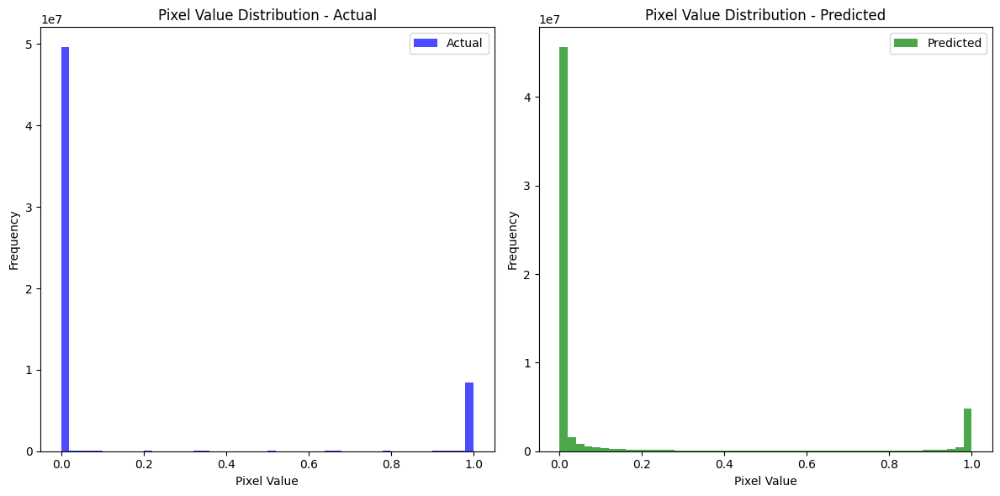

In [37]:
import numpy as np

# Function to plot pixel value distributions
def plot_pixel_distributions(actual, predicted, bins=50):
    plt.figure(figsize=(12, 6))

    # Plot distribution for actual images
    plt.subplot(1, 2, 1)
    plt.hist(actual.ravel(), bins=bins, color='blue', alpha=0.7, label='Actual')
    plt.title('Pixel Value Distribution - Actual')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.legend()

    # Plot distribution for predicted images
    plt.subplot(1, 2, 2)
    plt.hist(predicted.ravel(), bins=bins, color='green', alpha=0.7, label='Predicted')
    plt.title('Pixel Value Distribution - Predicted')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Assuming y_train and predictions are numpy arrays
plot_pixel_distributions(y_train, predictions)


### Plotting Train Forgery Detection Percentage

In [38]:
import numpy as np
import pandas as pd

# Function to compute overlapping white pixels ratio for each image
def compute_overlap_ratio(actual, predicted, threshold=0.5):
    ratios = []
    for i in range(len(actual)):
        # Binarize the images
        actual_white = actual[i] >= threshold
        predicted_white = predicted[i] >= threshold

        # Compute overlap and ground truth white pixels
        overlap = np.logical_and(actual_white, predicted_white)
        total_actual_white = np.sum(actual_white)

        # Calculate ratio (handle division by zero)
        if total_actual_white > 0:
            ratio = (np.sum(overlap) / total_actual_white) * 100
        else:
            ratio = 0  # No white pixels in ground truth

        ratios.append(ratio)

    return ratios

# Compute overlap ratios
overlap_ratios = compute_overlap_ratio(y_train, predictions)

# Store in a DataFrame and save to CSV
df = pd.DataFrame({"Image_Index": range(len(overlap_ratios)), "Overlap_Ratio (%)": overlap_ratios})
csv_path = "Train_percentage.csv"
df.to_csv(csv_path, index=False)

# Calculate and print average ratio
average_ratio = np.mean(overlap_ratios)
print(f"Average Overlap Ratio for All Images: {average_ratio:.2f}%")

csv_path


Average Overlap Ratio for All Images: 53.43%


'Train_percentage.csv'

38/38 ━━━━━━━━━━━━━━━━━━━━ 7s 182ms/step


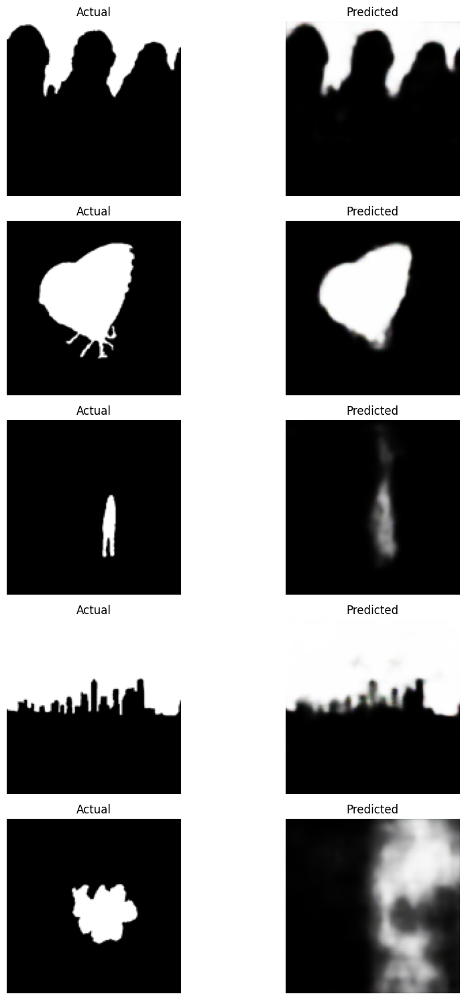

In [39]:
import matplotlib.pyplot as plt

# Predicting outputs on the training set
predictions = model.predict([x1_train, x2_train])

# Function to display images
def plot_images(actual, predicted, number_of_images=5):
    fig, axes = plt.subplots(number_of_images, 2, figsize=(10, 3 * number_of_images))
    for i in range(number_of_images):
        # Display actual image
        ax = axes[i, 0]
        ax.imshow(actual[i])
        ax.set_title('Actual')
        ax.axis('off')
        
        # Display predicted image
        ax = axes[i, 1]
        ax.imshow(predicted[i])
        ax.set_title('Predicted')
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# Plotting the images
plot_images(y_train[:10], predictions[:10])

### Display Predictions of Real Images 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


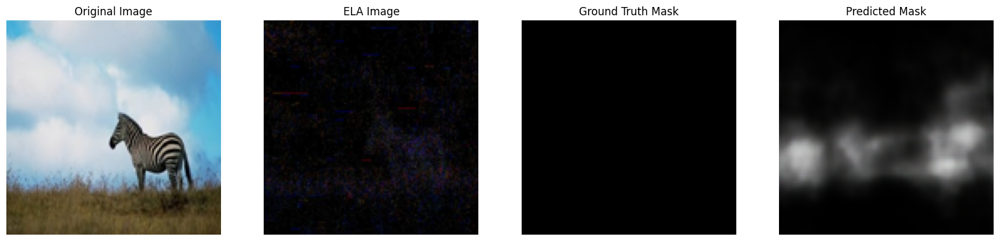

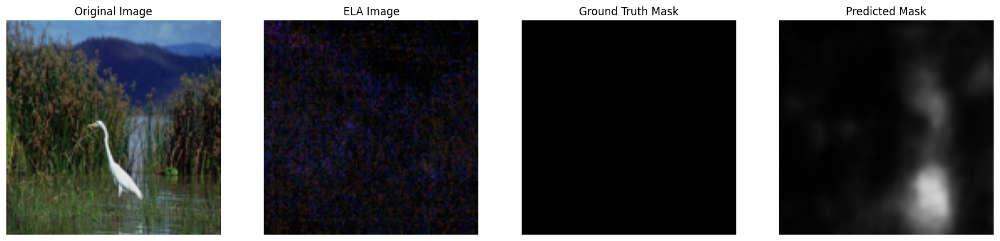

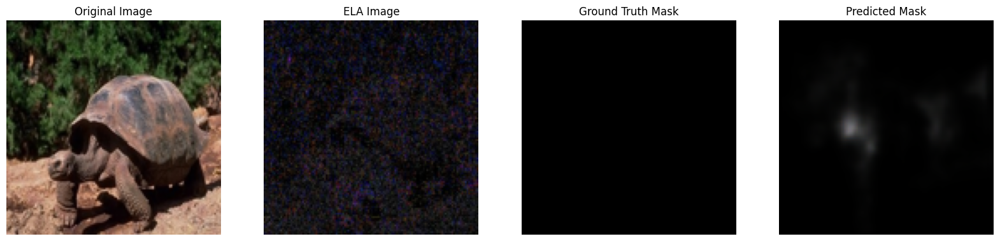

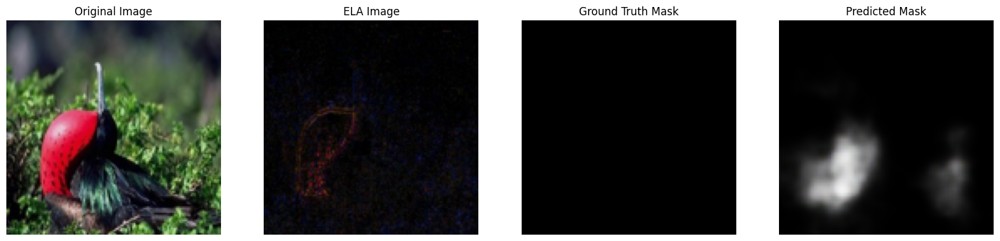

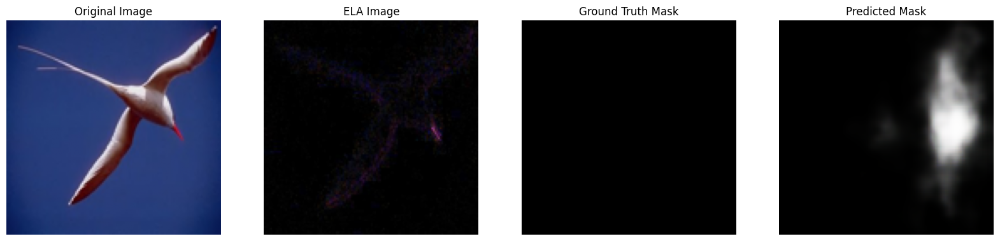

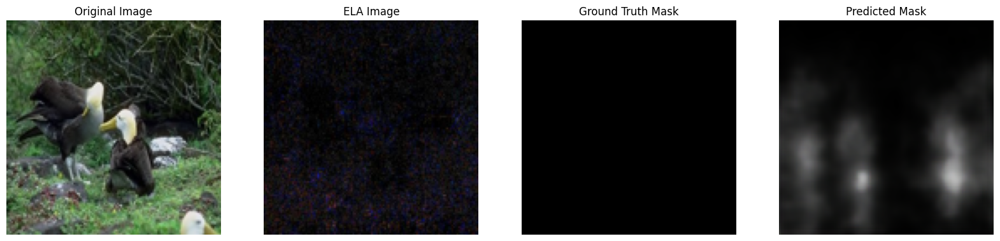

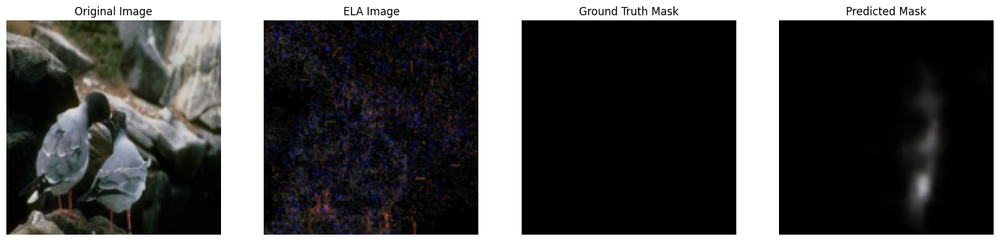

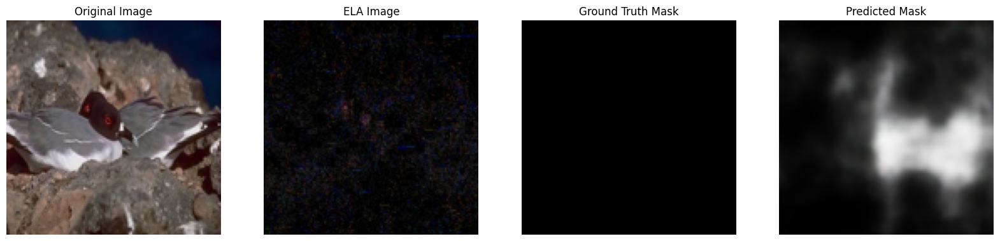

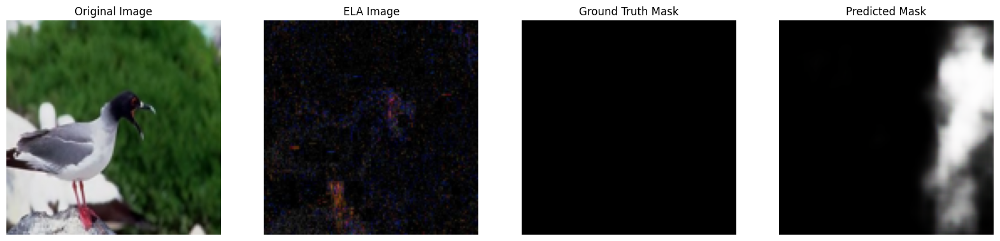

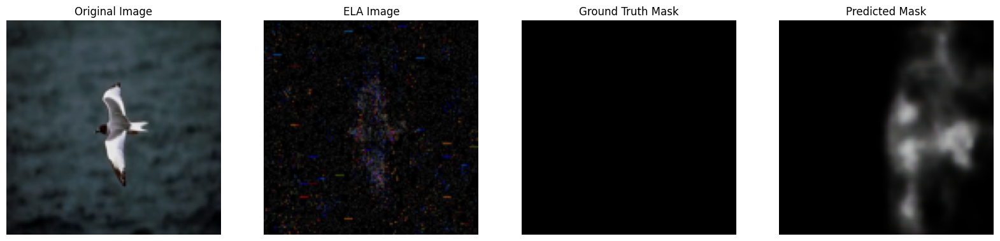

In [40]:
import matplotlib.pyplot as plt

# Function to predict and display results
def display_predictions(model, au_folder, ela_au_folder, gt_folder, image_size, num_samples=10):
    au_images = []  # Store original AU images
    ela_images = []  # Store corresponding ELA images
    masks = []  # Store corresponding masks
    
    file_names = os.listdir(au_folder)[:num_samples]
    for file_name in file_names:
        if file_name.lower().endswith(('jpg', 'bmp', 'tif', 'tiff', 'png')):
            # Paths
            au_path = os.path.join(au_folder, file_name)
            ela_path = os.path.join(ela_au_folder, file_name)
            base_name = file_name.rsplit('.', 1)[0]
            gt_name = base_name + "_gt.png"
            gt_path = os.path.join(gt_folder, gt_name)

            # Load AU and ELA images
            au_image = load_image(au_path, image_size)
            ela_image = load_image(ela_path, image_size)
            au_images.append(au_image)
            ela_images.append(ela_image)

            # Load mask if it exists
            if os.path.exists(gt_path):
                mask = load_image(gt_path, image_size)
                masks.append(mask)
            else:
                masks.append(np.zeros((128, 128, 3)))

    # Convert to NumPy arrays for prediction
    au_images = np.array(au_images)
    ela_images = np.array(ela_images)

    # Predict masks
    predicted_masks = model.predict([au_images, ela_images])

    # Display results
    for i in range(len(au_images)):
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))
        
        axes[0].imshow(au_images[i])
        axes[0].set_title("Original Image")
        axes[0].axis('off')
        
        axes[1].imshow(ela_images[i])
        axes[1].set_title("ELA Image")
        axes[1].axis('off')

        axes[2].imshow(masks[i])
        axes[2].set_title("Ground Truth Mask")
        axes[2].axis('off')

        axes[3].imshow(predicted_masks[i])
        axes[3].set_title("Predicted Mask")
        axes[3].axis('off')

        plt.show()

# Paths for Au folder and its ELA counterpart
au_folder = "C:/Users/vinay/Downloads/CASIA2.0_revised_corrected/casia/Au"
ela_au_folder = "C:/Users/vinay/Downloads/CASIA2.0_revised_corrected/casia/ELA_Tp_Au"

# Assume `model` is a pre-trained model loaded before
# Example: model = tf.keras.models.load_model("path_to_model")

# Display predictions
display_predictions(model, au_folder, ela_au_folder, gt_folder, image_size)


### Displaying predictions for noraml images the Tp images

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


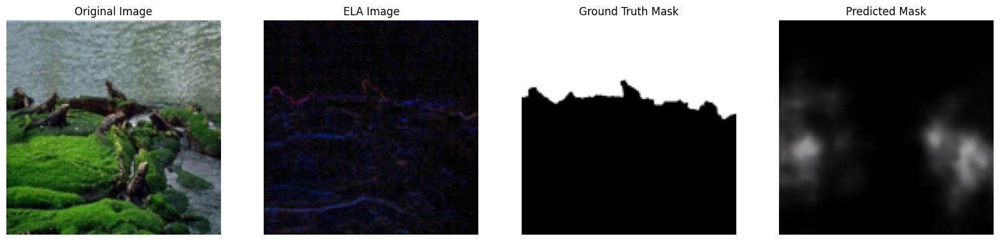

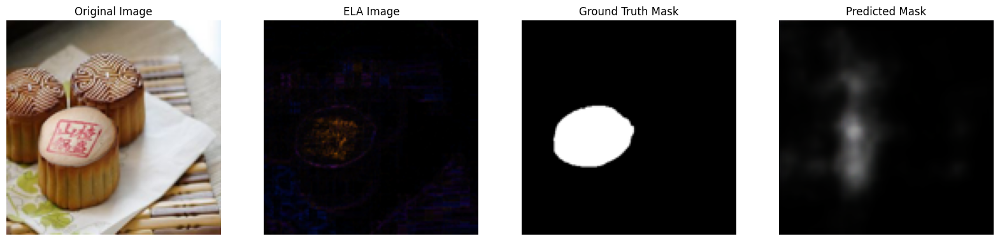

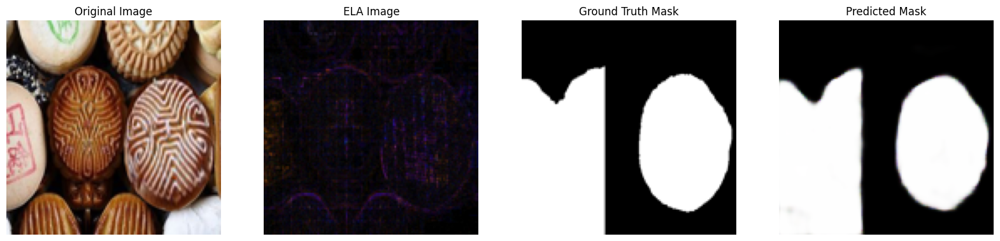

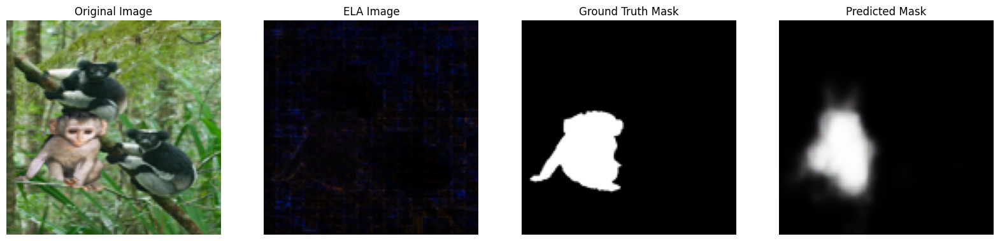

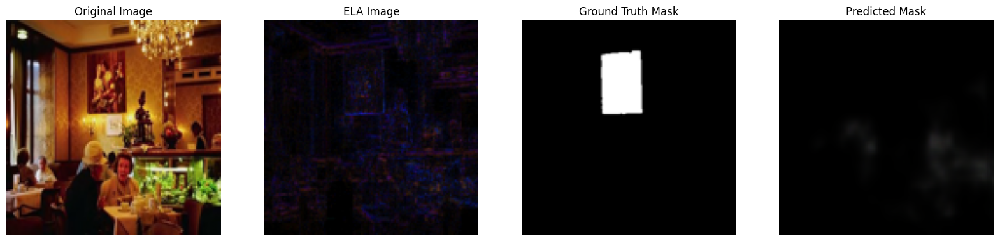

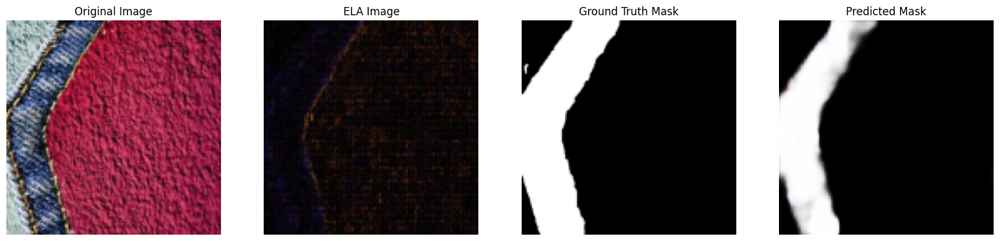

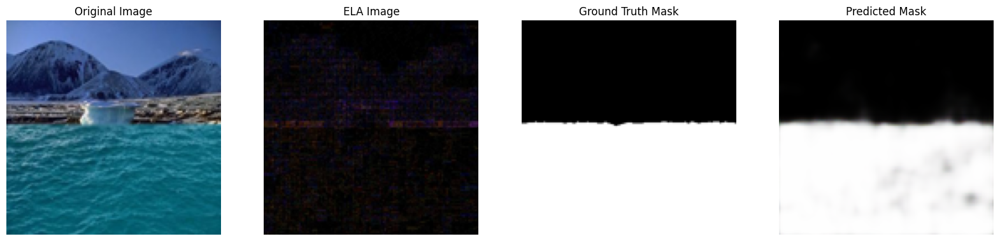

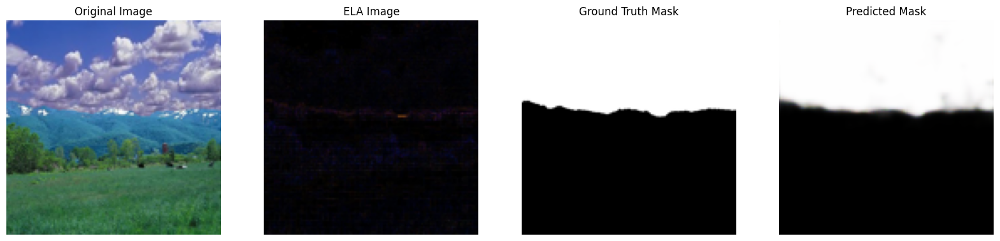

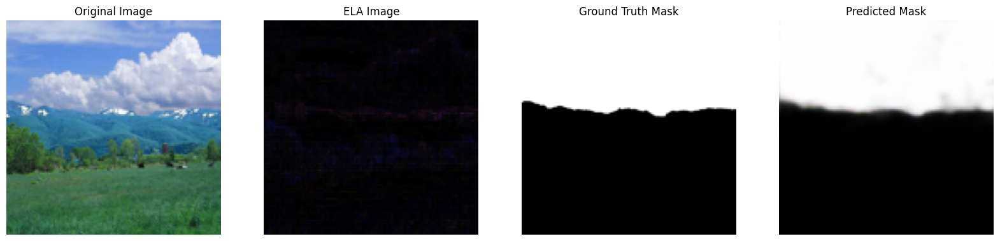

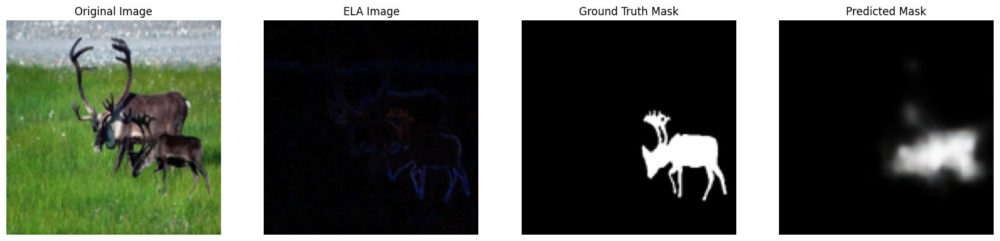

In [41]:
import matplotlib.pyplot as plt

# Function to predict and display results
def display_predictions(model, image_folder, ela_folder, gt_folder, image_size, num_samples=10):
    images = []  # Store original images
    ela_images = []  # Store corresponding ELA images
    masks = []  # Store corresponding masks
    
    file_names = os.listdir(image_folder)[:num_samples]
    for file_name in file_names:
        if file_name.lower().endswith(('jpg', 'bmp', 'tif', 'tiff', 'png')):
            # Paths
            image_path = os.path.join(image_folder, file_name)
            ela_path = os.path.join(ela_folder, file_name)
            base_name = file_name.rsplit('.', 1)[0]
            gt_name = base_name + "_gt.png"
            gt_path = os.path.join(gt_folder, gt_name)

            # Load images
            original_image = load_image(image_path, image_size)
            ela_image = load_image(ela_path, image_size)
            images.append(original_image)
            ela_images.append(ela_image)

            # Load mask if it exists
            if os.path.exists(gt_path):
                mask = load_image(gt_path, image_size)
                masks.append(mask)
            else:
                masks.append(np.zeros((image_size[0], image_size[1], 3)))  # Full black mask

    # Convert to NumPy arrays for prediction
    images = np.array(images)
    ela_images = np.array(ela_images)

    # Predict masks
    predicted_masks = model.predict([images, ela_images])

    # Display results
    for i in range(len(images)):
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))
        
        axes[0].imshow(images[i])
        axes[0].set_title("Original Image")
        axes[0].axis('off')
        
        axes[1].imshow(ela_images[i])
        axes[1].set_title("ELA Image")
        axes[1].axis('off')

        axes[2].imshow(masks[i])
        axes[2].set_title("Ground Truth Mask")
        axes[2].axis('off')

        axes[3].imshow(predicted_masks[i])
        axes[3].set_title("Predicted Mask")
        axes[3].axis('off')

        plt.show()

# Paths for Au folder and its ELA counterpart
au_folder = "C:/Users/vinay/Downloads/CASIA2.0_revised_corrected/casia/Au"
ela_au_folder = "C:/Users/vinay/Downloads/CASIA2.0_revised_corrected/casia/ELA_Au"
tp_folder = "C:/Users/vinay/Downloads/CASIA2.0_revised_corrected/casia/Tp"
ela_tp_folder = "C:/Users/vinay/Downloads/CASIA2.0_revised_corrected/casia/ELA_Tp"


# Display predictions for Tp images
display_predictions(model, tp_folder, ela_tp_folder, gt_folder, image_size)


In [2]:
from tensorflow.keras.models import load_model
import tensorflow.keras.losses

# Map 'mse' to the actual Keras loss function
custom_objects = {"mse": tensorflow.keras.losses.MeanSquaredError()}

# Load the model with custom objects
model = load_model("image_reconstruction_model.h5", custom_objects=custom_objects)

# Verify the loaded model
model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ Input_X1            │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Input_X2            │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_72 (Conv2D)  │ (None, 128, 128,  │      1,792 │ Input_X1[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_74 (Conv2D)  │ (None, 128, 128,  │      1,792 │ Input_X2[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_26    │ (None, 64, 64,    │          0 │ conv2d_72[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_28    │ (None, 64, 64,    │          0 │ conv2d_74[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_73 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d_26… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_75 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d_28… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_27    │ (None, 32, 32,    │          0 │ conv2d_73[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_29    │ (None, 32, 32,    │          0 │ conv2d_75[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_4 (Flatten) │ (None, 131072)    │          0 │ max_pooling2d_27… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_5 (Flatten) │ (None, 131072)    │          0 │ max_pooling2d_29… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_14      │ (None, 262144)    │          0 │ flatten_4[0][0],  │
│ (Concatenate)       │                   │            │ flatten_5[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 256)       │ 67,109,120 │ concatenate_14[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_7 (Dense)     │ (None, 512)       │    131,584 │ dense_6[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_8 (Dense)     │ (None, 131072)    │ 67,239,936 │ dense_7[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_2 (Reshape) │ (None, 32, 32,    │          0 │ dense_8[0][0]     │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_76 (Conv2D)  │ (None, 32, 32,    │    147,584 │ reshape_2[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 134,855,045 (514.43 MB)

 Trainable params: 134,855,043 (514.43 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

# AUC-RUC Score

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, roc_auc_score
import seaborn as sns

# Assuming predictions and y_train are provided as lists of probability arrays corresponding to each image
# Example: predictions = [np.array([...]), ...], y_train = [np.array([...]), ...]
sum_conf_matrix = np.zeros((2, 2), dtype=int)
all_auc_scores = []

for pred, actual in zip(predictions, y_train):
    predictions_binary = (pred > 0.5).astype(int)
    actual_binary = (actual > 0.5).astype(int)
    # Calculate AUC-ROC for each image, if possible
    if len(np.unique(actual)) > 1:  # Ensure there are both positive and negative samples
        auc_score = roc_auc_score(actual_binary.flatten(), predictions_binary.flatten())
        all_auc_scores.append(auc_score)


average_auc = np.mean(all_auc_scores) if all_auc_scores else 0
print(f"Average AUC-ROC Score: {average_auc:.4f}")


Average AUC-ROC Score: 0.7578


In [11]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, roc_auc_score
import seaborn as sns

# Assuming predictions and y_train are provided as lists of probability arrays corresponding to each image
# Example: predictions = [np.array([...]), ...], y_train = [np.array([...]), ...]
sum_conf_matrix = np.zeros((2, 2), dtype=int)
all_auc_scores = []

for pred, actual in zip(predictions, y_test):
    predictions_binary = (pred > 0.5).astype(int)
    actual_binary = (actual > 0.5).astype(int)
    # Calculate AUC-ROC for each image, if possible
    if len(np.unique(actual)) > 1:  # Ensure there are both positive and negative samples
        auc_score = roc_auc_score(actual_binary.flatten(), predictions_binary.flatten())
        all_auc_scores.append(auc_score)


average_auc = np.mean(all_auc_scores) if all_auc_scores else 0
print(f"Average AUC-ROC Score: {average_auc:.4f}")


Average AUC-ROC Score: 0.7678


### Traning and loss curves

In [14]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Dense, Flatten, Reshape
input_shape = (image_size[0], image_size[1], 3)

# First input
input_x1 = Input(shape=input_shape, name='Input_X1')
x1 = Conv2D(64, (3, 3), activation='relu', padding='same')(input_x1)
x1 = MaxPooling2D((2, 2))(x1)
x1 = Conv2D(128, (3, 3), activation='relu', padding='same')(x1)
x1 = MaxPooling2D((2, 2))(x1)
x1 = Flatten()(x1)

# Second input
input_x2 = Input(shape=input_shape, name='Input_X2')
x2 = Conv2D(64, (3, 3), activation='relu', padding='same')(input_x2)
x2 = MaxPooling2D((2, 2))(x2)
x2 = Conv2D(128, (3, 3), activation='relu', padding='same')(x2)
x2 = MaxPooling2D((2, 2))(x2)
x2 = Flatten()(x2)

# Combine features
combined = concatenate([x1, x2])
combined = Dense(256, activation='relu')(combined)
combined = Dense(512, activation='relu')(combined)

# Reshape for reconstruction
reconstruct_shape = (image_size[0] // 4, image_size[1] // 4, 128)
combined = Dense(reconstruct_shape[0] * reconstruct_shape[1] * reconstruct_shape[2], activation='relu')(combined)
combined = Reshape(reconstruct_shape)(combined)

# Reconstruction
x = Conv2D(128, (3, 3), activation='relu', padding='same')(combined)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
output = Conv2D(3, (3, 3), activation='sigmoid', padding='same', name='Output')(x)

# Define the model
model = Model(inputs=[input_x1, input_x2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])

# Model summary
model.summary()

# Train the model
history = model.fit(
    [x1_train, x2_train], y_train,
    validation_split=0.2,
    epochs=20,
    batch_size=16
)



Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ Input_X1            │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Input_X2            │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │      1,792 │ Input_X1[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │      1,792 │ Input_X2[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ conv2d[0][0]      │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 64, 64,    │          0 │ conv2d_2[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 64, 64,    │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │     73,856 │ max_pooling2d_2[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 32, 32,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 131072)    │          0 │ max_pooling2d_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_1 (Flatten) │ (None, 131072)    │          0 │ max_pooling2d_3[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 262144)    │          0 │ flatten[0][0],    │
│ (Concatenate)       │                   │            │ flatten_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 256)       │ 67,109,120 │ concatenate[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 512)       │    131,584 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 131072)    │ 67,239,936 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 32, 32,    │          0 │ dense_2[0][0]     │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │    147,584 │ reshape[0][0]     │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 134,855,043 (514.43 MB)

 Trainable params: 134,855,043 (514.43 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 66s 949ms/step - accuracy: 0.3945 - loss: 0.1612 - val_accuracy: 0.6670 - val_loss: 0.1250
Epoch 2/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 55s 923ms/step - accuracy: 0.2730 - loss: 0.1241 - val_accuracy: 0.2256 - val_loss: 0.1123
Epoch 3/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 55s 917ms/step - accuracy: 0.3022 - loss: 0.1204 - val_accuracy: 0.2942 - val_loss: 0.1079
Epoch 4/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 55s 920ms/step - accuracy: 0.3590 - loss: 0.1138 - val_accuracy: 0.3086 - val_loss: 0.1048
Epoch 5/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 55s 917ms/step - accuracy: 0.3387 - loss: 0.1048 - val_accuracy: 0.3476 - val_loss: 0.1000
Epoch 6/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 56s 927ms/step - accuracy: 0.3400 - loss: 0.0954 - val_accuracy: 0.0551 - val_loss: 0.0937
Epoch 7/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 56s 931ms/step - accuracy: 0.0988 - loss: 0.0764 - val_accuracy: 0.3337 - val_loss: 0.0901
Epoch 8/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 56s 927ms/step - accuracy: 0.4075 - loss: 0.0668 - val_accu

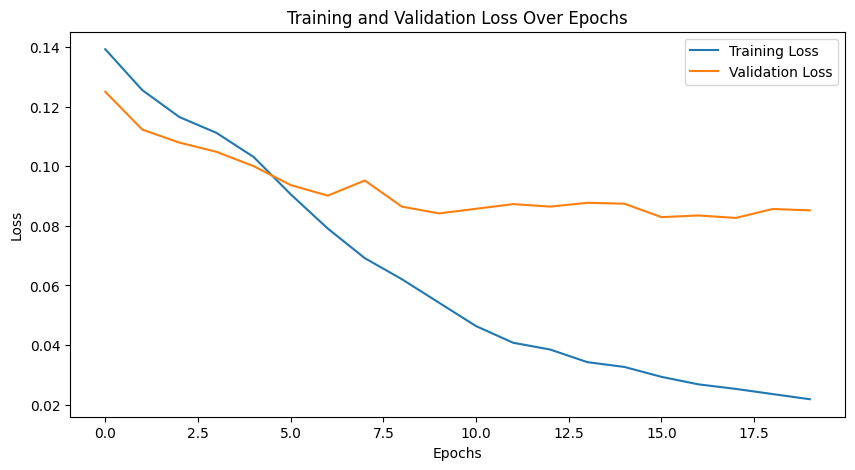

In [15]:
import matplotlib.pyplot as plt

# Assuming 'history' is the object returned by model.fit()
loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a line plot for the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


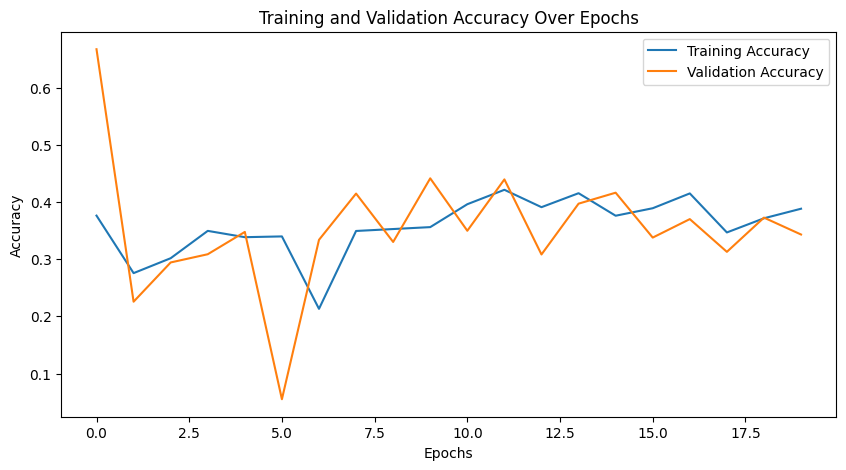

In [16]:
import matplotlib.pyplot as plt

# Assuming 'history' is the object returned by model.fit()
# Note: Depending on your model configuration, it could be 'accuracy' or 'acc' and 'val_accuracy' or 'val_acc'
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Create a line plot for the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


In [18]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Dense, Flatten, Reshape
input_shape = (image_size[0], image_size[1], 3)

# First input
input_x1 = Input(shape=input_shape, name='Input_X1')
x1 = Conv2D(64, (3, 3), activation='relu', padding='same')(input_x1)
x1 = MaxPooling2D((2, 2))(x1)
x1 = Conv2D(128, (3, 3), activation='relu', padding='same')(x1)
x1 = MaxPooling2D((2, 2))(x1)
x1 = Flatten()(x1)

# Second input
input_x2 = Input(shape=input_shape, name='Input_X2')
x2 = Conv2D(64, (3, 3), activation='relu', padding='same')(input_x2)
x2 = MaxPooling2D((2, 2))(x2)
x2 = Conv2D(128, (3, 3), activation='relu', padding='same')(x2)
x2 = MaxPooling2D((2, 2))(x2)
x2 = Flatten()(x2)

# Combine features
combined = concatenate([x1, x2])
combined = Dense(256, activation='relu')(combined)
combined = Dense(512, activation='relu')(combined)

# Reshape for reconstruction
reconstruct_shape = (image_size[0] // 4, image_size[1] // 4, 128)
combined = Dense(reconstruct_shape[0] * reconstruct_shape[1] * reconstruct_shape[2], activation='relu')(combined)
combined = Reshape(reconstruct_shape)(combined)

# Reconstruction
x = Conv2D(128, (3, 3), activation='relu', padding='same')(combined)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
output = Conv2D(3, (3, 3), activation='sigmoid', padding='same', name='Output')(x)

# Define the model
model = Model(inputs=[input_x1, input_x2], outputs=output)
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])

# Model summary
model.summary()

# Train the model
history = model.fit(
    [x1_train, x2_train], y_train,
    validation_split=0.2,
    epochs=100,
    batch_size=16
)



Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ Input_X1            │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Input_X2            │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 128, 128,  │      1,792 │ Input_X1[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_14 (Conv2D)  │ (None, 128, 128,  │      1,792 │ Input_X2[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 64, 64,    │          0 │ conv2d_12[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_10    │ (None, 64, 64,    │          0 │ conv2d_14[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_13 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d_8[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_15 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d_10… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_9     │ (None, 32, 32,    │          0 │ conv2d_13[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_11    │ (None, 32, 32,    │          0 │ conv2d_15[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_4 (Flatten) │ (None, 131072)    │          0 │ max_pooling2d_9[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_5 (Flatten) │ (None, 131072)    │          0 │ max_pooling2d_11… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 262144)    │          0 │ flatten_4[0][0],  │
│ (Concatenate)       │                   │            │ flatten_5[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 256)       │ 67,109,120 │ concatenate_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_7 (Dense)     │ (None, 512)       │    131,584 │ dense_6[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_8 (Dense)     │ (None, 131072)    │ 67,239,936 │ dense_7[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_2 (Reshape) │ (None, 32, 32,    │          0 │ dense_8[0][0]     │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_16 (Conv2D)  │ (None, 32, 32,    │    147,584 │ reshape_2[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 134,855,043 (514.43 MB)

 Trainable params: 134,855,043 (514.43 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 59s 935ms/step - accuracy: 0.3446 - loss: 0.1458 - val_accuracy: 0.1088 - val_loss: 0.1354
Epoch 2/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 54s 903ms/step - accuracy: 0.3405 - loss: 0.1328 - val_accuracy: 0.3275 - val_loss: 0.1244
Epoch 3/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 54s 903ms/step - accuracy: 0.3535 - loss: 0.1202 - val_accuracy: 0.4573 - val_loss: 0.1099
Epoch 4/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 54s 903ms/step - accuracy: 0.3628 - loss: 0.1144 - val_accuracy: 0.4123 - val_loss: 0.1051
Epoch 5/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 54s 902ms/step - accuracy: 0.3315 - loss: 0.1025 - val_accuracy: 0.5013 - val_loss: 0.1028
Epoch 6/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 55s 918ms/step - accuracy: 0.4577 - loss: 0.0891 - val_accuracy: 0.3119 - val_loss: 0.0957
Epoch 7/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 54s 902ms/step - accuracy: 0.2934 - loss: 0.0804 - val_accuracy: 0.2863 - val_loss: 0.0966
Epoch 8/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 54s 903ms/step - accuracy: 0.3481 - loss: 0.0683 - 

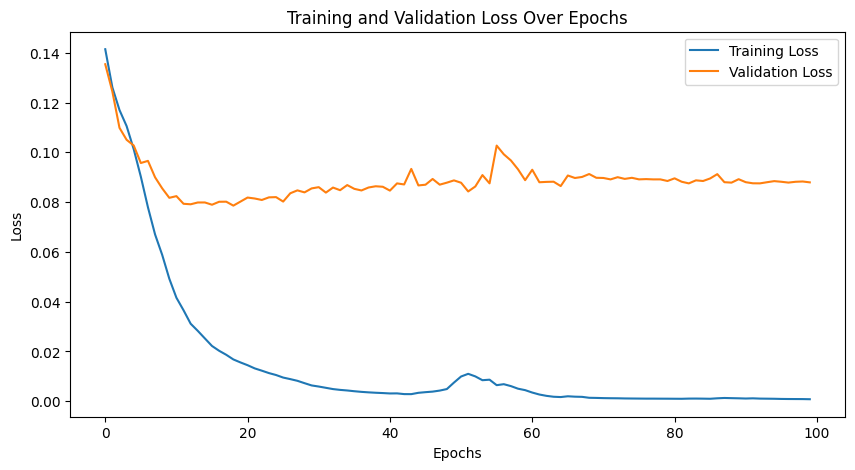

In [19]:
import matplotlib.pyplot as plt

# Assuming 'history' is the object returned by model.fit()
loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a line plot for the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


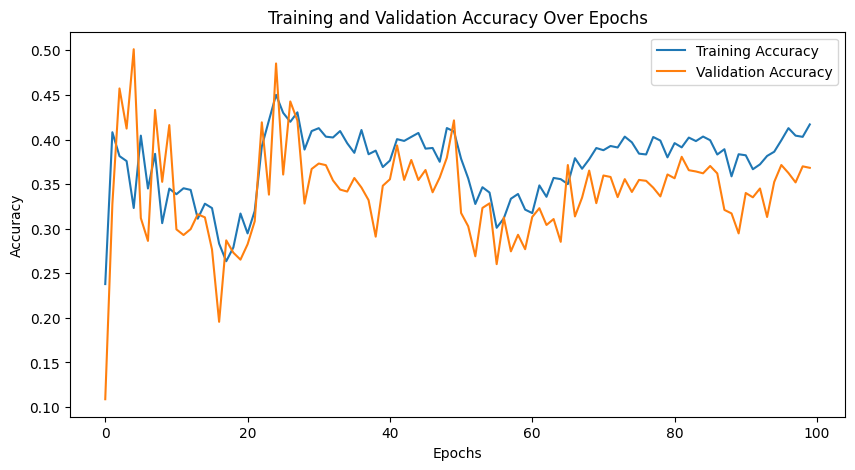

In [20]:
import matplotlib.pyplot as plt

# Assuming 'history' is the object returned by model.fit()
# Note: Depending on your model configuration, it could be 'accuracy' or 'acc' and 'val_accuracy' or 'val_acc'
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Create a line plot for the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 185ms/step
(300, 128, 128, 3)


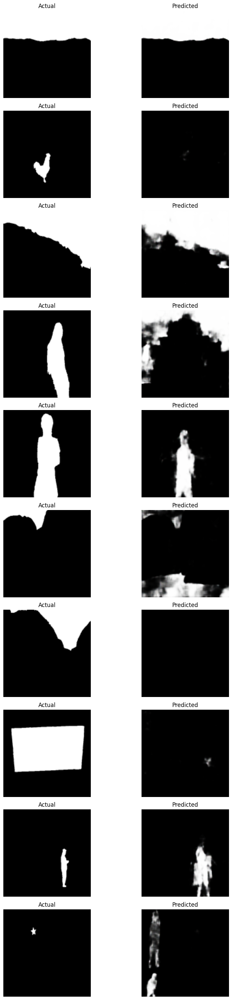

In [21]:
import matplotlib.pyplot as plt

# Predicting outputs on the training set
predictions = model.predict([x1_test, x2_test])

print(predictions.shape)

# Function to display images
def plot_images(actual, predicted, number_of_images=10):
    fig, axes = plt.subplots(number_of_images, 2, figsize=(10, 3 * number_of_images))
    for i in range(number_of_images):
        # Display actual image
        ax = axes[i, 0]
        ax.imshow(actual[i])
        ax.set_title('Actual')
        ax.axis('off')
        
        # Display predicted image
        ax = axes[i, 1]
        ax.imshow(predicted[i])
        ax.set_title('Predicted')
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# Plotting the images
plot_images(y_test[:10], predictions[:10])


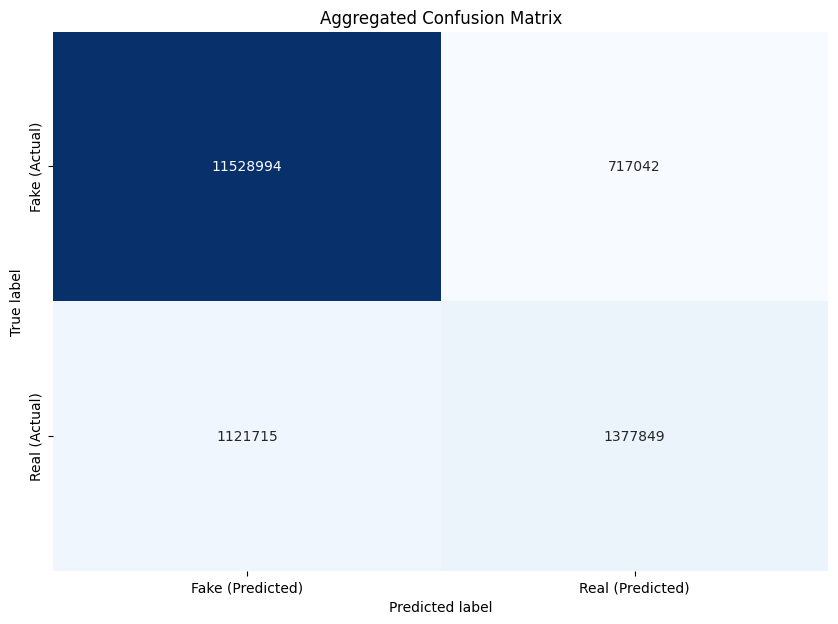

True Positives (TP): 1377849
True Negatives (TN): 11528994
False Positives (FP): 717042
False Negatives (FN): 1121715
Precision: 0.6577
Recall: 0.5512
F1-Score: 0.5998


In [22]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Assuming predictions and y_test are provided as lists of arrays corresponding to each image
# threshold = 0.5
sum_conf_matrix = np.zeros((2, 2), dtype=int)

for pred, actual in zip(predictions, y_test):
    predictions_binary = (pred > 0.5).astype(int)
    actual_binary = (actual > 0.5).astype(int)
    conf_matrix = confusion_matrix(actual_binary.flatten(), predictions_binary.flatten())
    sum_conf_matrix += conf_matrix

plt.figure(figsize=(10, 7))
sns.heatmap(sum_conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, 
            xticklabels=['Fake (Predicted)', 'Real (Predicted)'],
            yticklabels=['Fake (Actual)', 'Real (Actual)'])
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Aggregated Confusion Matrix')
plt.show()

tn, fp, fn, tp = sum_conf_matrix.ravel()

# Calculate Precision, Recall, and F1-Score
precision = tp / (tp + fp) if (tp + fp) > 0 else 0
recall = tp / (tp + fn) if (tp + fn) > 0 else 0
f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

print(f"True Positives (TP): {tp}")
print(f"True Negatives (TN): {tn}")
print(f"False Positives (FP): {fp}")
print(f"False Negatives (FN): {fn}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1_score:.4f}")


38/38 ━━━━━━━━━━━━━━━━━━━━ 7s 186ms/step


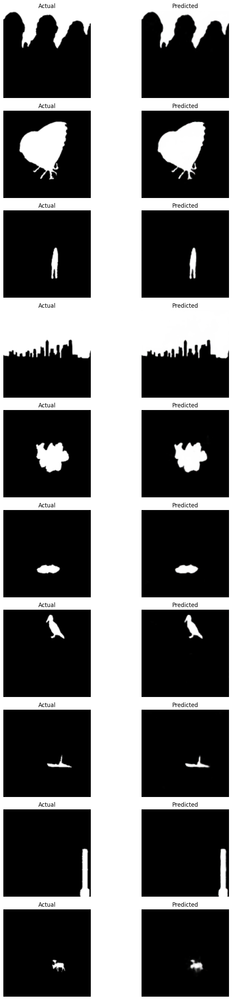

In [25]:
import matplotlib.pyplot as plt

# Predicting outputs on the training set
predictions = model.predict([x1_train, x2_train])

# Function to display images
def plot_images(actual, predicted, number_of_images=10):
    fig, axes = plt.subplots(number_of_images, 2, figsize=(10, 3 * number_of_images))
    for i in range(number_of_images):
        # Display actual image
        ax = axes[i, 0]
        ax.imshow(actual[i])
        ax.set_title('Actual')
        ax.axis('off')
        
        # Display predicted image
        ax = axes[i, 1]
        ax.imshow(predicted[i])
        ax.set_title('Predicted')
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# Plotting the images
plot_images(y_train[:10], predictions[:10])

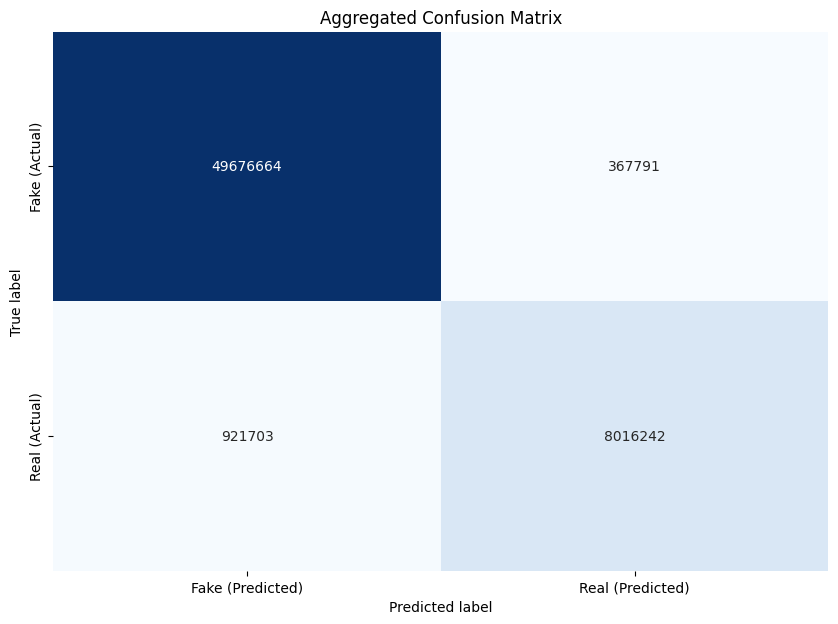

True Positives (TP): 8016242
True Negatives (TN): 49676664
False Positives (FP): 367791
False Negatives (FN): 921703
Precision: 0.9561
Recall: 0.8969
F1-Score: 0.9256


In [24]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Assuming predictions and y_test are provided as lists of arrays corresponding to each image
# threshold = 0.5
sum_conf_matrix = np.zeros((2, 2), dtype=int)

for pred, actual in zip(predictions, y_train):
    predictions_binary = (pred > 0.5).astype(int)
    actual_binary = (actual > 0.5).astype(int)
    conf_matrix = confusion_matrix(actual_binary.flatten(), predictions_binary.flatten())
    sum_conf_matrix += conf_matrix

plt.figure(figsize=(10, 7))
sns.heatmap(sum_conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, 
            xticklabels=['Fake (Predicted)', 'Real (Predicted)'],
            yticklabels=['Fake (Actual)', 'Real (Actual)'])
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Aggregated Confusion Matrix')
plt.show()

tn, fp, fn, tp = sum_conf_matrix.ravel()

# Calculate Precision, Recall, and F1-Score
precision = tp / (tp + fp) if (tp + fp) > 0 else 0
recall = tp / (tp + fn) if (tp + fn) > 0 else 0
f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

print(f"True Positives (TP): {tp}")
print(f"True Negatives (TN): {tn}")
print(f"False Positives (FP): {fp}")
print(f"False Negatives (FN): {fn}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1_score:.4f}")
